## 📖 Tech Challenge: Visão Computacional
#### Desafio: Treinar um modelo para identificação de câncer de pele por imagens.

### ✅ 1. Importação das Bibliotecas

##### Abaixo iremos realizar o import das bibliotecas, e a definição do pytorch e do uso da GPU para visão computacional.

In [ ]:
#----------------------------------------------------------------------------
# Imports Iniciais
#----------------------------------------------------------------------------
import os
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import keras
import torch
import cv2 
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
import torch, torch.nn as nn, torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.transforms as T
from tensorflow.keras.applications import MobileNetV2
import kagglehub
from scipy import stats
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import warnings
from sklearn.utils import class_weight
from tensorflow.keras.optimizers import Adam
from sklearn.utils.class_weight import compute_class_weight

warnings.filterwarnings("ignore", category=UserWarning,
                        module="keras.*trainers.data_adapters.py")

os.environ["KERAS_BACKEND"] = "torch"
tf.keras.backend.set_image_data_format('channels_last') 
tf.get_logger().setLevel('ERROR') 

from keras import layers, ops, Mode, Input
from sklearn.model_selection import train_test_split

c:\Users\flmli\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### 🧪 2. Preparação dos dados

##### Iremos iniciar aqui o download do primeiro dataset: kfarjanakabirsamanta/skin-cancer-dataset
##### Usaremos esse dataset para realizar o treinamento do modelo CNN
##### O dataset rm1000/skin-cancer-isic-images possui apenas imagens, sem rotulação por meio de um metadata. Usaremos essas imagens ao final para aplicação do modelo treinado.

In [2]:
#----------------------------------------------------------------------------
# Função para download dos datasets
#----------------------------------------------------------------------------
def download_dataset(base_dir_name):
    path = kagglehub.dataset_download(base_dir_name)
    print("Path to dataset files:", path)
    return path

In [3]:
#----------------------------------------------------------------------------
# Download dos Datasets: skin-cancer-dataset e skin-cancer-mnist-ham10000
#----------------------------------------------------------------------------
#dataset_file1 = download_dataset("kmader/skin-cancer-mnist-ham10000")
dataset_file1 = download_dataset("farjanakabirsamanta/skin-cancer-dataset")
dataset_file2 = download_dataset("rm1000/skin-cancer-isic-images")

Path to dataset files: C:\Users\flmli\.cache\kagglehub\datasets\farjanakabirsamanta\skin-cancer-dataset\versions\1
Path to dataset files: C:\Users\flmli\.cache\kagglehub\datasets\rm1000\skin-cancer-isic-images\versions\1


In [4]:
#----------------------------------------------------------------------------
# Carregando os arquivos dos metadados
#----------------------------------------------------------------------------
metadata = pd.read_csv(dataset_file1 + "/HAM10000_metadata.csv")

#----------------------------------------------------------------------------
# Validando datasets antes do tratamento dos dados
#----------------------------------------------------------------------------
print("Dataset 1: skin-cancer-dataset")
metadata.head()

Dataset 1: skin-cancer-dataset


,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [5]:
metadata.shape
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
dtypes: float64(1), object(6)
memory usage: 547.8+ KB


##### Iremos aqui definir o metadata, editar e criar os campos necessários para a análise exploratória e treinamento do modelo.

In [6]:
#----------------------------------------------------------------------------
# Tratamento e preparação dos dados
#----------------------------------------------------------------------------
mapeamento_diagnostico = {
    'akiec': 'Queratose actínica',
    'bcc'  : 'Carcinoma basocelular',
    'bkl'  : 'Lesão benigna tipo queratose',
    'df'   : 'Dermatofibroma',
    'mel'  : 'Melanoma',
    'nv'   : 'Nevo melanocítico',
    'vasc' : 'Lesão vascular'
}

metadata['diagnosis_desc'] = metadata['dx'].map(mapeamento_diagnostico)

mapeamento_localizacao = {
    'abdomen':          'Abdômen',
    'acral':            'Acrol',
    'back':             'Costas',
    'chest':            'Tórax',
    'ear':              'Orelha',
    'face':             'Face',
    'foot':             'Pé',
    'genital':          'Genitais',
    'hand':             'Mão',
    'lower extremity':  'Extremidade inferior',
    'neck':             'Pescoço',
    'scalp':            'Couro cabeludo',
    'trunk':            'Tronco',
    'unknown':          'Desconhecido',
    'upper extremity':  'Extremidade superior'
}

metadata['localization'] = metadata['localization'].map(mapeamento_localizacao).fillna(metadata['localization'])

renomean_col_mapeamento = {
    'lesion_id': 'id_lesao',
    'image_id': 'image_id',
    'dx': 'codigo_diagnostico',
    'dx_type': 'tipo_diagnostico',
    'age': 'idade',
    'sex': 'sexo',
    'localization': 'localizacao',
    'diagnosis_desc': 'diagnostico',
    'image_path': 'image_path'
}
metadata = metadata.rename(columns=renomean_col_mapeamento)

mapeamento_genero = {
    'male': 'Masculino',
    'female': 'Feminino',
    'unknown': 'Desconhecido'
}

metadata['sexo'] = metadata['sexo'].replace(mapeamento_genero)

mapeamento_tipo = {
    "histo": "Biópsia / Exame de tecido",
    "consensus": "Diagnóstico por consenso médico",
    "confocal": "Imagem confocal",
    "follow_up": "Acompanhamento clínico"
}

metadata['tipo_diagnostico'] = metadata['tipo_diagnostico'].replace(mapeamento_tipo)

print('Registros carregados:', len(metadata))

Registros carregados: 10015


In [7]:
#----------------------------------------------------------------------------
# Adicionando caminho das imagens no dataframe
#----------------------------------------------------------------------------
#PARTS   = [os.path.join(dataset_file1, 'HAM10000_images_part_1'),
#           os.path.join(dataset_file1, 'HAM10000_images_part_2')]

base_path = os.path.join(dataset_file1, "Skin Cancer", "Skin Cancer")

def encontrar_imagens(image_id):
    nome_arquivo = f"{image_id}.jpg"
    caminho = os.path.join(base_path, nome_arquivo)
    if os.path.isfile(caminho):
        return caminho
    return None

metadata['image_path'] = metadata['image_id'].apply(encontrar_imagens)
metadata['image_path'] = metadata['image_path'].astype(str)

num_encontradas = metadata['image_path'].apply(lambda x: os.path.isfile(x)).sum()
print(f"Imagens encontradas no dataset: {num_encontradas} / {len(metadata)}")


Imagens encontradas no dataset: 10015 / 10015


##### Aqui criamos uma coluna binária para definição de positivo ou negativo para câncer
##### Por definição, é considerado câncer de pele quando o diagnóstico possui um desses 3 valores: Melanoma (mel), Carcinoma basocelular (bcc) e Queratose actínica (akiec).

In [8]:
#----------------------------------------------------------------------------
# Criando coluna indicando câncer ou não para análise exploratória
#----------------------------------------------------------------------------
codigos_cancer = {'akiec', 'bcc', 'mel'}

metadata['cancer'] = metadata['codigo_diagnostico'].isin(codigos_cancer).astype(int)
metadata.head()

,id_lesao,image_id,codigo_diagnostico,tipo_diagnostico,idade,sexo,localizacao,diagnostico,image_path,cancer
0,HAM_0000118,ISIC_0027419,bkl,Biópsia / Exame de tecido,80.0,Masculino,Couro cabeludo,Lesão benigna tipo queratose,C:\Users\flmli\.cache\kagglehub\datasets\farja...,0
1,HAM_0000118,ISIC_0025030,bkl,Biópsia / Exame de tecido,80.0,Masculino,Couro cabeludo,Lesão benigna tipo queratose,C:\Users\flmli\.cache\kagglehub\datasets\farja...,0
2,HAM_0002730,ISIC_0026769,bkl,Biópsia / Exame de tecido,80.0,Masculino,Couro cabeludo,Lesão benigna tipo queratose,C:\Users\flmli\.cache\kagglehub\datasets\farja...,0
3,HAM_0002730,ISIC_0025661,bkl,Biópsia / Exame de tecido,80.0,Masculino,Couro cabeludo,Lesão benigna tipo queratose,C:\Users\flmli\.cache\kagglehub\datasets\farja...,0
4,HAM_0001466,ISIC_0031633,bkl,Biópsia / Exame de tecido,75.0,Masculino,Orelha,Lesão benigna tipo queratose,C:\Users\flmli\.cache\kagglehub\datasets\farja...,0


### 👀 3. Análise Exploratória

#### Aqui iremos extrair alguns gráficos para analisar os dados do dataframe antes de partirmos para a preparação do modelo CNN.

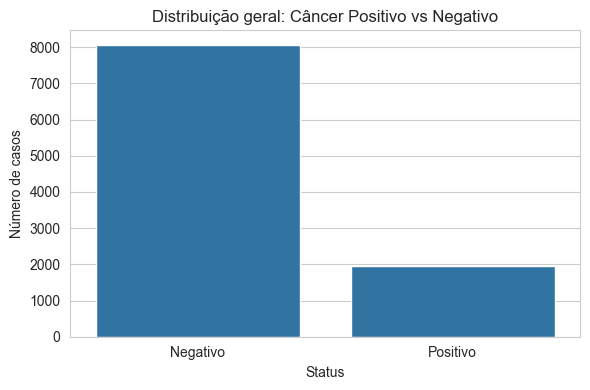

In [9]:
#----------------------------------------------------------------------------
# Análise Exploratória
#----------------------------------------------------------------------------
sns.set_style("whitegrid")

#----------------------------------------------------------------------------
# Gráfico de barras: Distribuição geral de câncer positivo vs negativo
#----------------------------------------------------------------------------
plt.figure(figsize=(6,4))
ax = sns.countplot(data=metadata, x='cancer')
ax.set_xticks([0, 1])
ax.set_xticklabels(['Negativo', 'Positivo'])
ax.set_xlabel('Status')
ax.set_ylabel('Número de casos')
ax.set_title('Distribuição geral: Câncer Positivo vs Negativo')
plt.tight_layout()
plt.show()

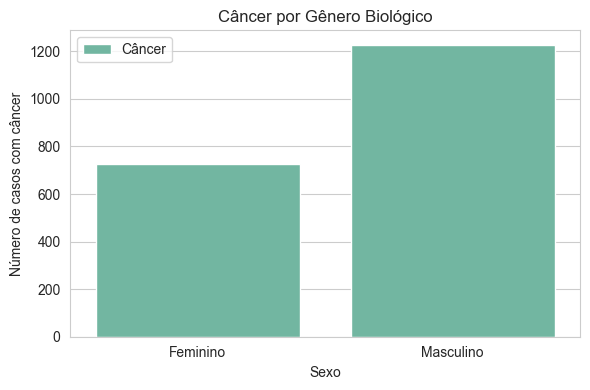

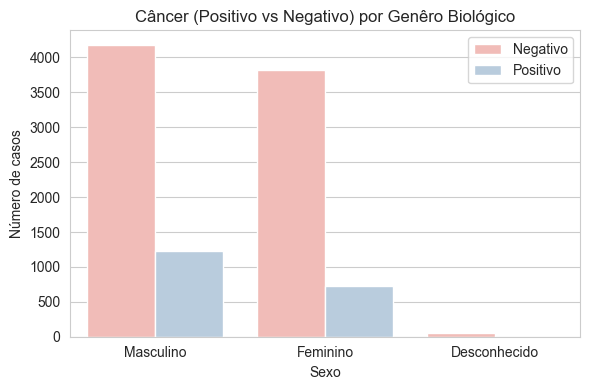

In [10]:
#----------------------------------------------------------------------------
# Gráfico de barras: Câncer por Gênero Biológico
#----------------------------------------------------------------------------
plt.figure(figsize=(6,4))
ax = sns.countplot(data=metadata[metadata['cancer']==1],
                    x='sexo', hue='cancer',
                    palette="Set2")
ax.set_xlabel('Sexo')
ax.set_ylabel('Número de casos com câncer')
ax.set_title('Câncer por Gênero Biológico')
plt.legend(title='', labels=['Câncer'])
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(6,4))
sns.countplot(data=metadata,
              x='sexo',
              hue='cancer',
              palette="Pastel1",
              ax=ax)
ax.set_xlabel('Sexo')
ax.set_ylabel('Número de casos')
ax.set_title('Câncer (Positivo vs Negativo) por Genêro Biológico')
plt.legend(title='', labels=['Negativo', 'Positivo'])
plt.tight_layout()
plt.show()

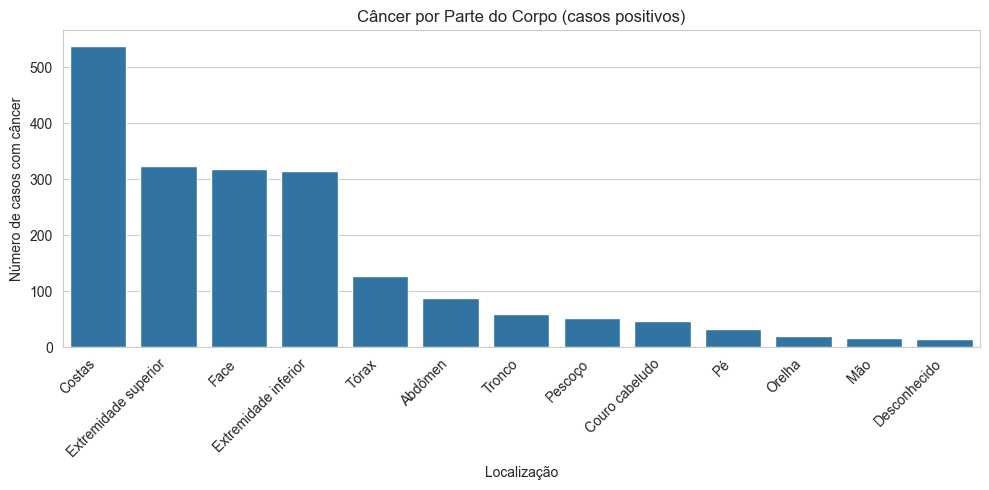

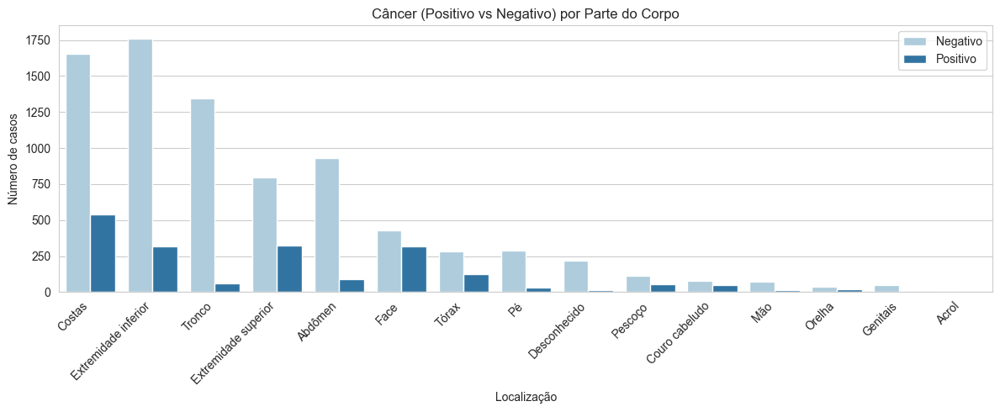

In [11]:
#----------------------------------------------------------------------------
# Gráfico de barras: Câncer por Localização 
#----------------------------------------------------------------------------
locs = metadata[metadata['cancer']==1]['localizacao'].value_counts().index

plt.figure(figsize=(10,5))
ax = sns.countplot(data=metadata[metadata['cancer']==1],
                    x='localizacao',
                    order=locs)
ax.set_xlabel('Localização')
ax.set_ylabel('Número de casos com câncer')
ax.set_title('Câncer por Parte do Corpo (casos positivos)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(12,5))
sns.countplot(data=metadata,
              x='localizacao',
              hue='cancer',
              order=metadata['localizacao'].value_counts().index,
              palette="Paired",
              ax=ax)
ax.set_xlabel('Localização')
ax.set_ylabel('Número de casos')
ax.set_title('Câncer (Positivo vs Negativo) por Parte do Corpo')
plt.xticks(rotation=45, ha='right')
plt.legend(title='', labels=['Negativo', 'Positivo'])
plt.tight_layout()
plt.show()

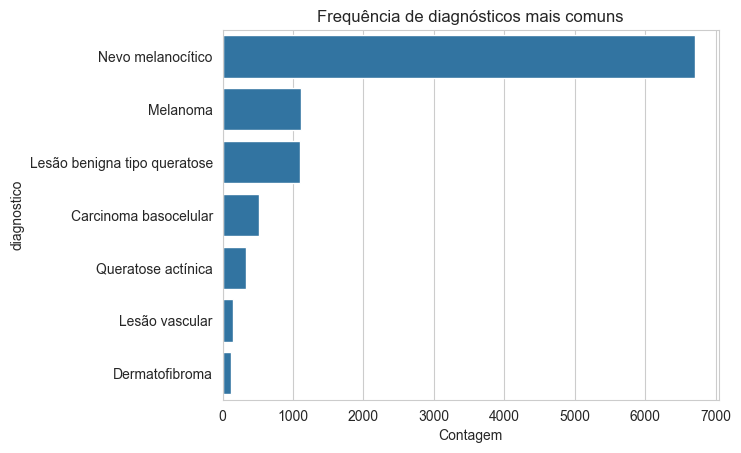

In [12]:
#----------------------------------------------------------------------------
# Gráfico de diagnósticos mais frequentes
#----------------------------------------------------------------------------
top_diag = metadata['diagnostico'].value_counts().head(10)
sns.barplot(x=top_diag.values, y=top_diag.index)
plt.title('Frequência de diagnósticos mais comuns')
plt.xlabel('Contagem')
plt.show()

##### Aqui já percebemos que há um desbalanceamento de classes, com a classe "Nevo melanocítico" possuindo muito mais frequência que as demais classes. Isso deverá ser levado em conta na hora de definirmos o peso para cada classe no processamento do modelo.

##### Abaixo iremos extrair algumas amostras visuais de nosso dataset.


Amostras visuais por classe de diagnóstico:


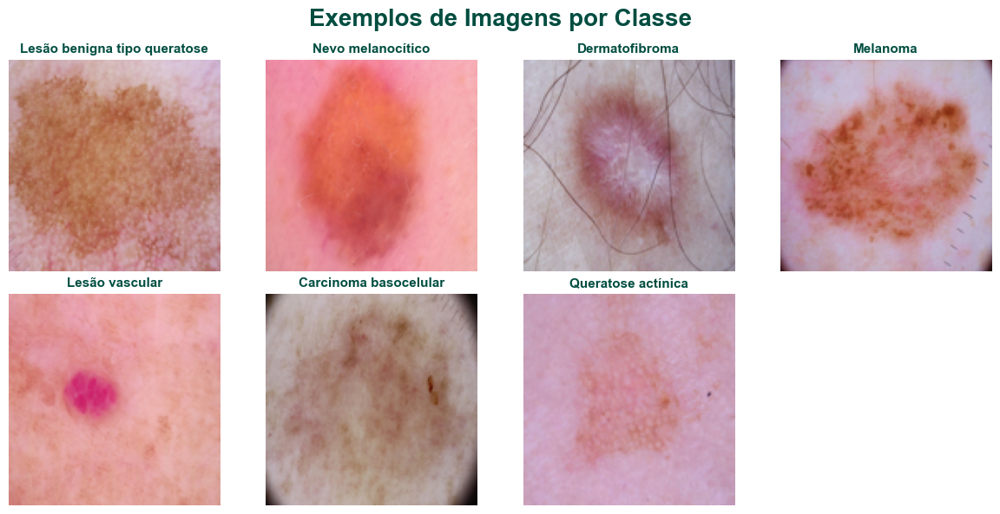

In [13]:
# ------------------------------------------------------------------
# Amostras Visuais
# ------------------------------------------------------------------
print("\nAmostras visuais por classe de diagnóstico:")

unique_labels = metadata['diagnostico'].unique()
cols = 4
rows = (len(unique_labels) + cols - 1) // cols

plt.figure(figsize=(3*cols, 3*rows))
for i, label in enumerate(unique_labels):
    subset = metadata[metadata['diagnostico'] == label]
    if subset.empty:
        continue
    sample_row = subset.sample(1, random_state=42).iloc[0]
    img = Image.open(sample_row['image_path']).convert('RGB')
    plt.subplot(rows, cols, i+1)
    plt.imshow(img.resize((128,128)))
    plt.title(label, fontsize=11, color="#004D40", weight='semibold')
    plt.axis('off')

plt.suptitle("Exemplos de Imagens por Classe", fontsize=20, weight='bold', color="#004D40", y=0.98)
plt.tight_layout()
plt.show()

##### Vamos tirar mais alguns gráficos para analisar o balanceamento das classes.

Contagem por classe de diagnóstico:


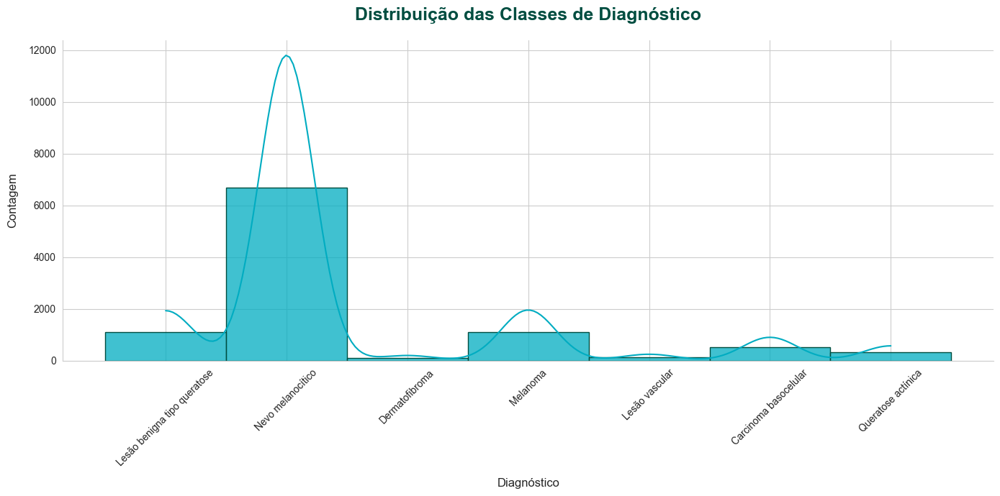

diagnostico
Nevo melanocítico               6705
Melanoma                        1113
Lesão benigna tipo queratose    1099
Carcinoma basocelular            514
Queratose actínica               327
Lesão vascular                   142
Dermatofibroma                   115
Name: count, dtype: int64


In [14]:
# ------------------------------------------------------------------
# Distribuição das Classes
# ------------------------------------------------------------------
plt.figure(figsize=(14, 7))

sns.histplot(
    data=metadata,
    x='diagnostico',
    kde=True,
    bins=len(metadata['diagnostico'].unique()),
    color="#00ACC1",
    edgecolor="#004D40",
    alpha=0.75
)

print("Contagem por classe de diagnóstico:")

plt.title("Distribuição das Classes de Diagnóstico", fontsize=18, weight='bold', pad=20, color="#004D40")
plt.xlabel("Diagnóstico", fontsize=12, labelpad=10)
plt.ylabel("Contagem", fontsize=12, labelpad=10)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
sns.despine()
plt.tight_layout()
plt.show()

contagem = metadata['diagnostico'].value_counts()
print(contagem)


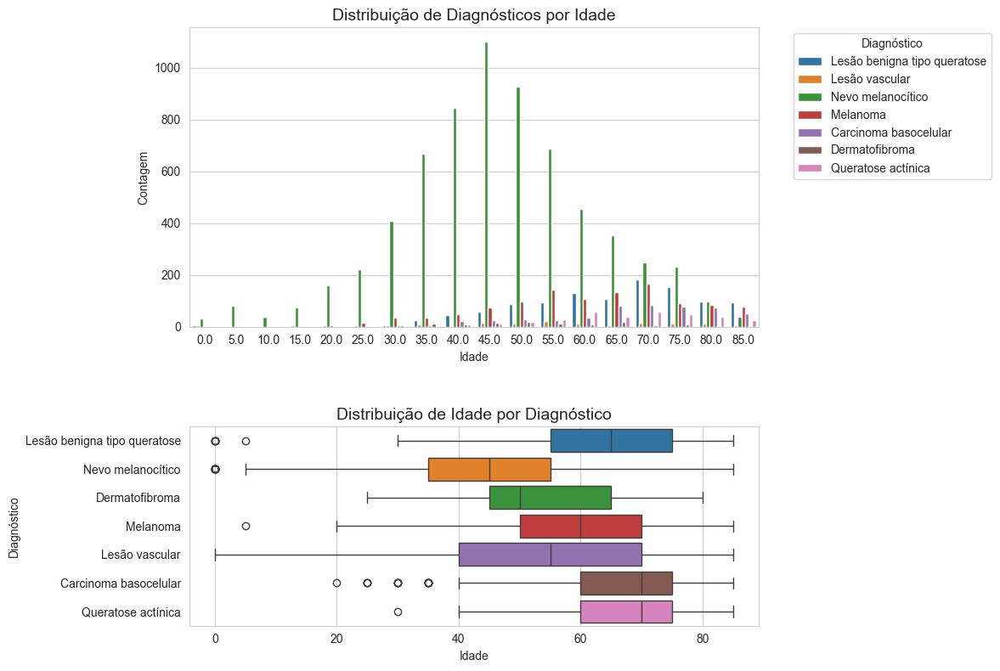

In [15]:
# ------------------------------------------------------------------
# Histograma: contagem de diagnósticos por idade
# ------------------------------------------------------------------
plt.rcParams["figure.figsize"] = (12, 8)
unique_diag = sorted(metadata['diagnostico'].unique())

fig, axes = plt.subplots(
    nrows=2,
    ncols=1,
    gridspec_kw={'height_ratios': [1.5, 1]},
    sharex=False
)

ax_hist, ax_box = axes

hist_obj = sns.countplot(
    data=metadata,
    x='idade',
    hue='diagnostico',
    ax=ax_hist
)

ax_hist.set_title('Distribuição de Diagnósticos por Idade', fontsize=14)
ax_hist.set_xlabel('Idade')
ax_hist.set_ylabel('Contagem')
hist_handles, hist_labels = hist_obj.get_legend_handles_labels()

ax_hist.legend(
    title='Diagnóstico',
    bbox_to_anchor=(1.05, 1),
    loc='upper left'
)

# ------------------------------------------------------------------
# Boxplot – distribuição de idade por diagnóstico (sem warning)
# ------------------------------------------------------------------
box_obj = sns.boxplot(
    data=metadata,
    x='idade',
    y='diagnostico',
    hue='diagnostico',      
    legend=False,             
    ax=ax_box
)

if ax_box.get_legend() is not None:
    ax_box.get_legend().remove()

ax_box.set_title('Distribuição de Idade por Diagnóstico', fontsize=14)
ax_box.set_xlabel('Idade')
ax_box.set_ylabel('Diagnóstico')

# ------------------------------------------------------------------
# Exibição dos gráficos
# ------------------------------------------------------------------
plt.tight_layout()
plt.subplots_adjust(hspace=0.4)
plt.show()

##### Vamos analisar a correlação entre as variáveis numéricas ou binárias
##### Depois iremos verificar a correlação das principais variáveis classificatórias

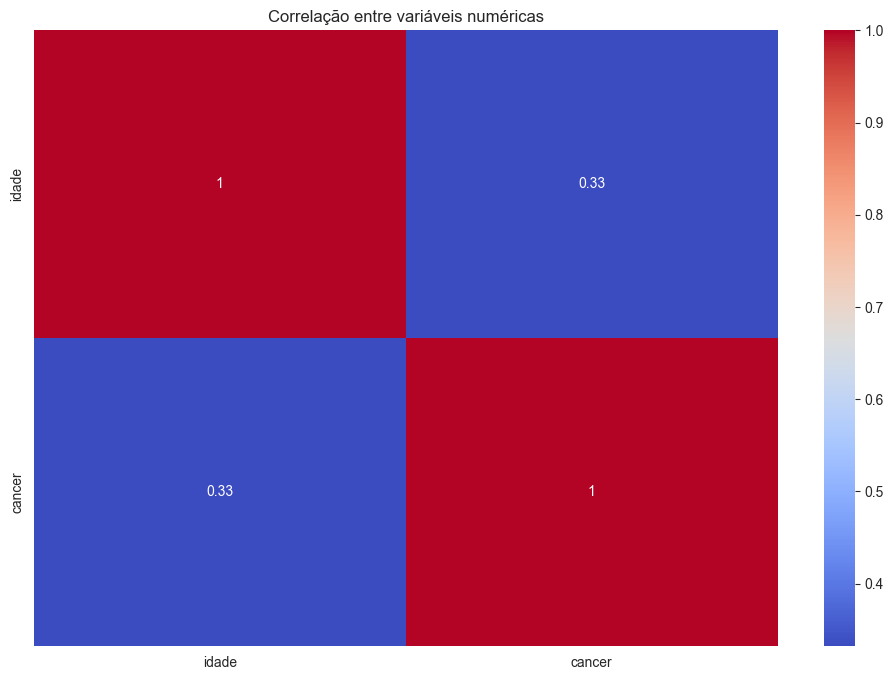

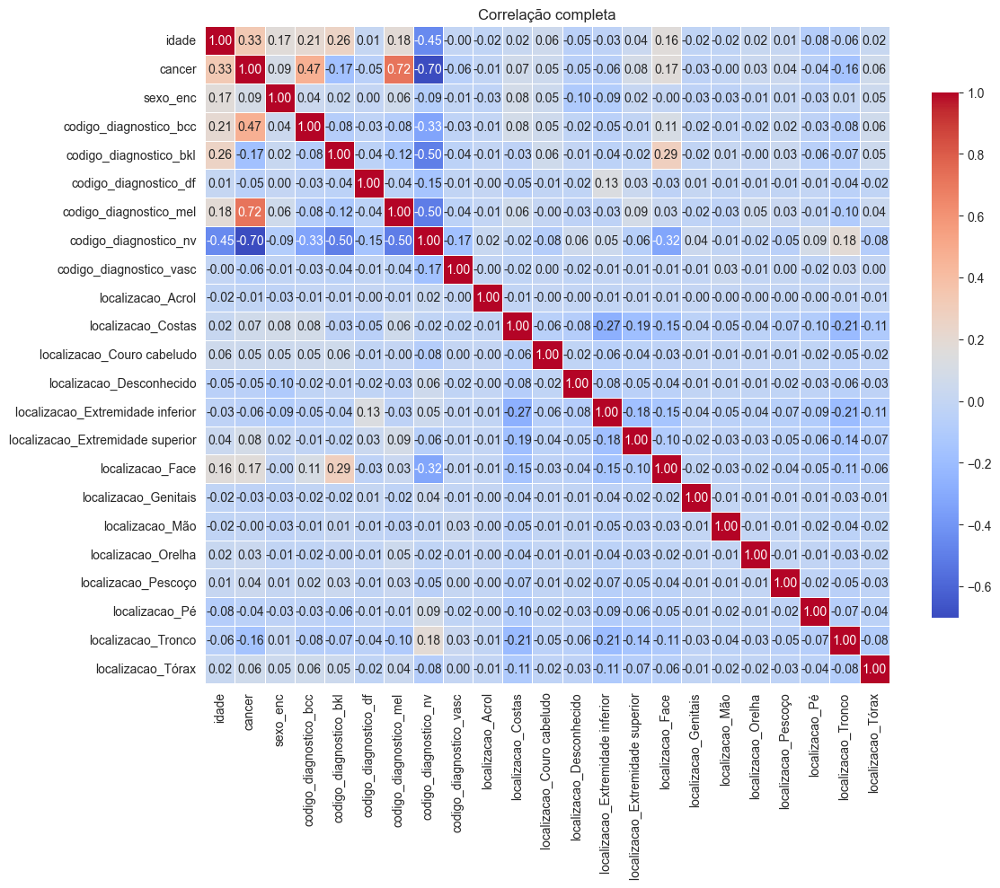

In [16]:
#----------------------------------------------------------------------------
# Correlação entre variáveis numéricas
#----------------------------------------------------------------------------
corr = metadata.select_dtypes(include=['number']).corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlação entre variáveis numéricas')
plt.show()

#----------------------------------------------------------------------------
# Correlação entre variáveis categóricas e numéricas
#----------------------------------------------------------------------------
metadata_corr = metadata.copy()
le_sex = OrdinalEncoder()
metadata_corr['sexo_enc'] = le_sex.fit_transform(metadata_corr[['sexo']]) 
cols_categoricas = ['codigo_diagnostico', 'localizacao']

oh = OneHotEncoder(drop='first',
                   sparse_output=False)  
oh_df = pd.DataFrame(oh.fit_transform(metadata_corr[cols_categoricas]),
                     columns=oh.get_feature_names_out(cols_categoricas),
                     index=metadata_corr.index)

df_corr = metadata_corr.drop(columns=cols_categoricas + ['sexo']) \
             .join(oh_df)  

cols_to_drop = ['id_lesao', 'image_id',
                'tipo_diagnostico', 'image_path','diagnostico']
df_corr_clean = df_corr.drop(columns=cols_to_drop)

corr2 = df_corr_clean.corr()

plt.figure(figsize=(12,10))
sns.heatmap(corr2, annot=True, cmap='coolwarm', fmt='.2f',
            linewidths=.5, cbar_kws={'shrink': .8})
plt.title('Correlação completa')
plt.tight_layout()
plt.show()


##### Vamos detectar os outliers na única coluna numérica que temos: idade

Número de outliers (Z-score) em idade: 39


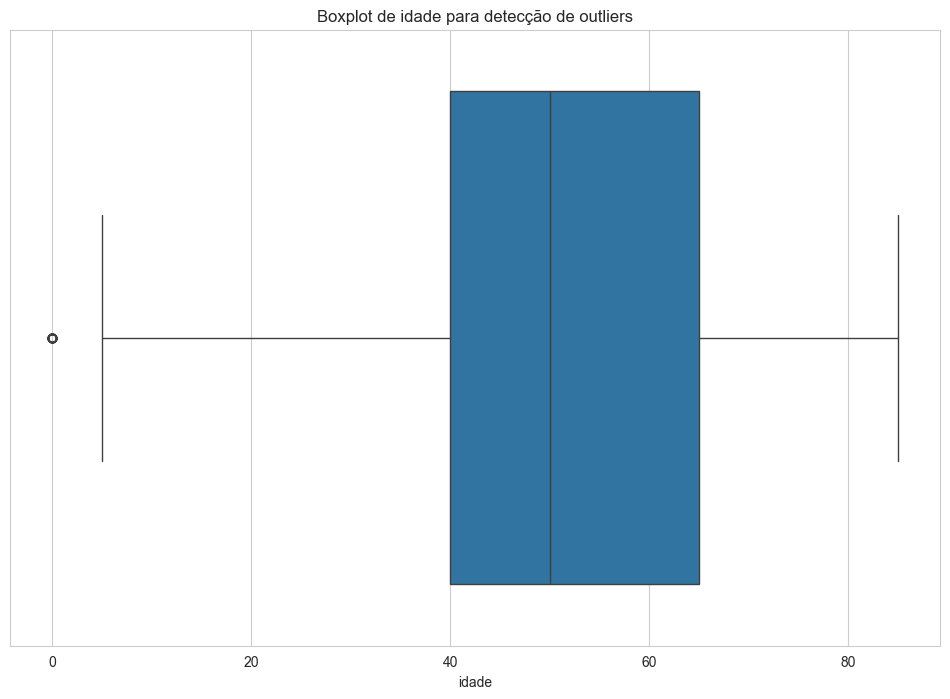

In [17]:
#----------------------------------------------------------------------------
# Detectando outliers
#----------------------------------------------------------------------------
z_scores = np.abs(stats.zscore(metadata["idade"].dropna()))
threshold = 3
outliers_mask_z = z_scores > threshold
print(f"Número de outliers (Z-score) em idade:", outliers_mask_z.sum())

sns.boxplot(x=metadata["idade"])
plt.title(f'Boxplot de {"idade"} para detecção de outliers')
plt.show()


### 🧹4. Limpeza de Dados

##### Aqui iremos realizar uma limpeza de dados antes do processamento do modelo.
##### Identificamos pelos gráficos que necessitaremos excluir da base os registros com a informação aonde o genêro retornou "desconhecido" e a localização retornou "desconhecido".
##### Também iremos remover os outliers do campo idade.

In [18]:
#----------------------------------------------------------------------------
# Removendo outliers
#----------------------------------------------------------------------------
idx_outliers = metadata.index[metadata["idade"].notna()][outliers_mask_z]

metadata_outlier = metadata.drop(index=idx_outliers).reset_index(drop=True)
print(f"Linhas após remoção: {len(metadata_outlier)}")

metadata = metadata_outlier.copy()

#----------------------------------------------------------------------------
# Remoção de valores desconhecidos de "sexo" e "localizacao" do metadata
#----------------------------------------------------------------------------
print(f"Linhas antes de remover inválidos: {len(metadata)}")
metadata = metadata[metadata['sexo'].isin(['Masculino', 'Feminino'])]
metadata = metadata[metadata['localizacao'].notna()]
print(f"Linhas após remover inválidos: {len(metadata)}")

Linhas após remoção: 9976
Linhas antes de remover inválidos: 9976
Linhas após remover inválidos: 9921


In [19]:
#----------------------------------------------------------------------------
# Limpeza do Metadata
#----------------------------------------------------------------------------
metadata_limpo = metadata.copy()
metadata_limpo.drop_duplicates(inplace=True)
print(f"Linhas após remover duplicados: {len(metadata_limpo)}")

cols_cruciais = ['diagnostico', 'localizacao', 'cancer', 'idade', 'sexo', 'codigo_diagnostico']   # ajuste conforme seu dataset
metadata_limpo.dropna(subset=cols_cruciais, inplace=True)

if metadata_limpo['idade'].isna().any():
    metadata_limpo['idade'].fillna(metadata_limpo['idade'].median(), inplace=True)

print(f"Linhas após tratar faltantes: {len(metadata_limpo)}")

le_diag = LabelEncoder()
metadata_limpo['diag_enc'] = le_diag.fit_transform(metadata_limpo['diagnostico'])
metadata_limpo = metadata_limpo[metadata_limpo['image_path'].apply(os.path.exists)]
print(f"Linhas após filtrar arquivos inexistentes: {len(metadata_limpo)}")

Linhas após remover duplicados: 9921
Linhas após tratar faltantes: 9911
Linhas após filtrar arquivos inexistentes: 9911


##### Preparar Treinamento

##### Aqui iremos preparar os dados para o treinamento do modelo CNN.
##### Iremos criar os modelos de teste e de validação.

In [21]:
#----------------------------------------------------------------------------
# Preparando Treinamento
#----------------------------------------------------------------------------
le = LabelEncoder()
metadata['label'] = le.fit_transform(metadata['diagnostico'])
train_df, temp_df = train_test_split(metadata, stratify=metadata['label'], test_size=0.25, random_state=42)
val_df, test_df = train_test_split(temp_df, stratify=temp_df['label'], test_size=0.5, random_state=42)

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.1, height_shift_range=0.1, zoom_range=0.1, horizontal_flip=True)
val_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='diagnostico', target_size=IMG_SIZE, class_mode='categorical', batch_size=BATCH_SIZE)
val_gen = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='diagnostico', target_size=IMG_SIZE, class_mode='categorical', batch_size=BATCH_SIZE)
test_gen = val_datagen.flow_from_dataframe(test_df, x_col='image_path', y_col='diagnostico', target_size=IMG_SIZE, class_mode='categorical', batch_size=BATCH_SIZE, shuffle=False)


Found 7440 validated image filenames belonging to 7 classes.
Found 1240 validated image filenames belonging to 7 classes.
Found 1241 validated image filenames belonging to 7 classes.


##### Abaixo iremos plotar no gráfico as primeiras 25 imagens do dataset de teste para validação do mesmo.

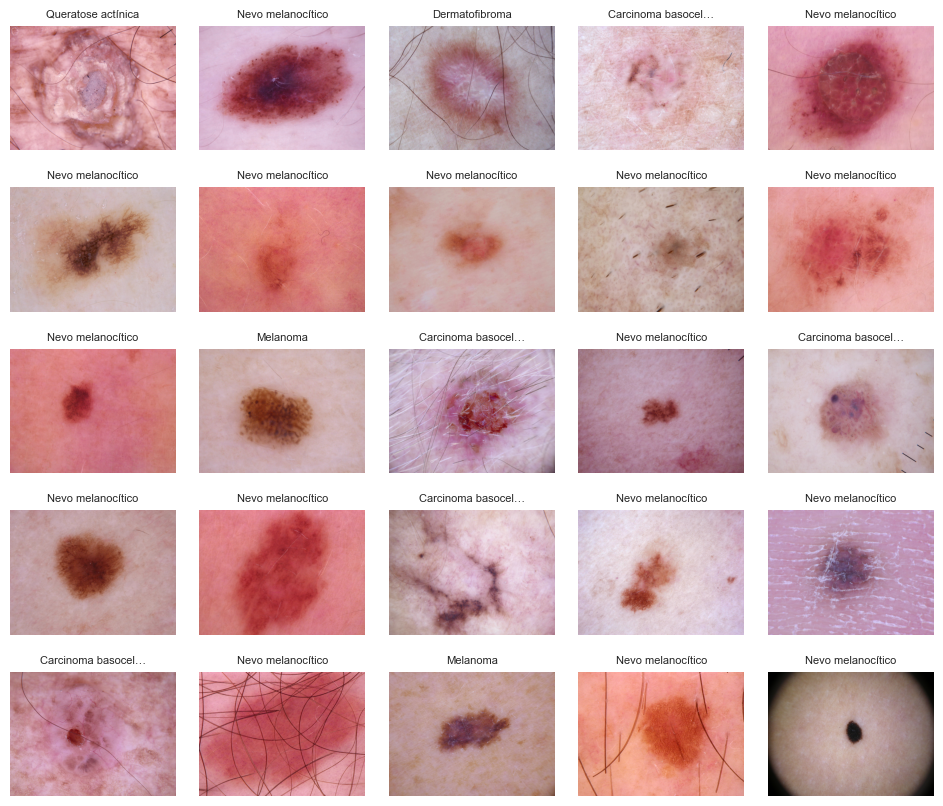

In [22]:
#----------------------------------------------------------------------------
# Plotando primeiras 25 imagens do conjunto de treinamento
#----------------------------------------------------------------------------
plt.figure(figsize=(12, 10)) 
for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    img_path = train_df.iloc[i]['image_path']
    img      = Image.open(img_path)
    ax.imshow(img, cmap=plt.cm.binary)
    ax.set_xticks([])
    ax.set_yticks([])
    title_text = str(train_df.iloc[i]['diagnostico'])
    if len(title_text) > 20:                   
        title_text = title_text[:17] + '…'     
    ax.set_title(title_text, fontsize=8, loc='center')
    ax.grid(False)
    ax.axis('off')
    plt.subplots_adjust(wspace=0.1, hspace=0.3)
plt.show()

##### Abaixo iremos preparar o modelo CNN

##### Optei por usar o backbone "MobileNetV2" após diversos testes por possuir a melhor performance e também a melhor precisão que consegui durante os testes.
##### Nos comentários está um código com um modelo CNN criado, porém que teve um desempenho muito abaixo do esperado.

In [ ]:
# ------------------------------------------------------------------
# Executando o CNN: MobileNetV2
# ------------------------------------------------------------------
base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)) 

x = GlobalAveragePooling2D()(base.output)
x = Dropout(0.3)(x)

num_classes = len(train_gen.class_indices) 
outputs = Dense(num_classes, activation='softmax')(x)
model = Model(inputs=base.input, outputs=outputs) 

for layer in base.layers[:-5]: 
    layer.trainable = False 

model.compile(optimizer=Adam(1e-4), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])
model.summary()

###### MODELO CNN CONSTRUIDO ANTERIORMENTE
###### TROQUEI ESTE POR UM MOBILENETV3 DEVIDO A DESEMPENHO E ACURACIA BAIXA

#IMG_HEIGHT, IMG_WIDTH = IMG_SIZE

#NUM_CLASSES = len(train_gen.class_indices)
#print(f"Número de diagnósticos: {NUM_CLASSES}")

#metrics=[tf.keras.metrics.CategoricalAccuracy(),
#         tf.keras.metrics.Precision(),
#         tf.keras.metrics.Recall()]
#l2 = 0.01

#model = models.Sequential()

#model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), kernel_regularizer=regularizers.l2(l2)))
#model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)))
#model.add(layers.MaxPooling2D((2, 2)))
#model.add(layers.Dropout(0.25))

#model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)))
#model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2)))
#model.add(layers.MaxPooling2D((2, 2)))
#model.add(layers.Dropout(0.25))

#model.add(layers.GlobalAveragePooling2D()) 
#model.add(layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(l2)))
#model.add(layers.Dropout(0.5))
#model.add(layers.Dense(NUM_CLASSES, activation='softmax'))

#lr_initial = 1e-4
#opt = optimizers.Adam(learning_rate=lr_initial, clipnorm=1.0)

#model.compile(
#    optimizer=opt,
#    loss='categorical_crossentropy',
#    metrics=['accuracy']
#)

#model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,266,951 (8.65 MB)

 Trainable params: 728,967 (2.78 MB)

 Non-trainable params: 1,537,984 (5.87 MB)

##### Agora iremos realizar o balanceamento das classes e executar o fit do modelo

In [24]:
#----------------------------------------------------------------------------
# Treinando parando o modelo CNN
#----------------------------------------------------------------------------

classes = list(train_gen.class_indices.keys())
val_counts = pd.Series(val_gen.classes).value_counts().reindex(range(len(classes)), fill_value=0)
val_counts.index = classes
print("Distribuição das classes no conjunto de validação:\n")
print(val_counts)

# ------------------------------------------------------------------
# Calculando peso das classes
# ------------------------------------------------------------------
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_gen.classes),
    y=train_gen.classes
)

# ------------------------------------------------------------------
# Convertendo pesos para dicionário do KERAS
# ------------------------------------------------------------------
class_weights = dict(enumerate(class_weights))
print("\nPesos de classe calculados:", class_weights)

history = model.fit(
    train_gen,
    epochs=20,
    validation_data=val_gen,
    class_weight=class_weights,
    callbacks=[
        tf.keras.callbacks.ModelCheckpoint(
            'tech_challenge.keras',
            monitor='val_accuracy',
            save_best_only=True
        ),
        tf.keras.callbacks.EarlyStopping(
            monitor='val_accuracy',
            patience=7,
            restore_best_weights=True,
            mode='max' 
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy',
            factor=0.5,
            patience=3, 
            min_lr=1e-6
        )
    ],
    verbose=1
)

Distribuição das classes no conjunto de validação:

Carcinoma basocelular            64
Dermatofibroma                   15
Lesão benigna tipo queratose    135
Lesão vascular                   17
Melanoma                        139
Nevo melanocítico               829
Queratose actínica               41
Name: count, dtype: int64

Pesos de classe calculados: {0: np.float64(2.7606679035250465), 1: np.float64(12.358803986710964), 2: np.float64(1.3073273589878756), 3: np.float64(10.219780219780219), 4: np.float64(1.2728828058169375), 5: np.float64(0.21376853235260315), 6: np.float64(4.338192419825073)}
Epoch 1/20
233/233 ━━━━━━━━━━━━━━━━━━━━ 77s 312ms/step - accuracy: 0.3617 - loss: 1.6543 - val_accuracy: 0.2355 - val_loss: 3.0702 - learning_rate: 1.0000e-04
Epoch 2/20
233/233 ━━━━━━━━━━━━━━━━━━━━ 73s 307ms/step - accuracy: 0.5028 - loss: 1.2539 - val_accuracy: 0.4702 - val_loss: 1.7432 - learning_rate: 1.0000e-04
Epoch 3/20
233/233 ━━━━━━━━━━━━━━━━━━━━ 72s 304ms/step - accuracy: 0.5824 - l

### 🤔 4. Avaliação

##### Abaixo iremos avaliar o modelo treinado e a precisão alcançada para cada uma das classes treinadas do campo "diagnóstico"

In [25]:
#----------------------------------------------------------------------------
# Avaliação
#----------------------------------------------------------------------------
preds = model.predict(test_gen)
y_pred = np.argmax(preds, axis=1)
y_true = test_gen.classes

print(classification_report(
    y_true, 
    y_pred, 
    target_names=list(train_gen.class_indices.keys()),
    zero_division=0
))

39/39 ━━━━━━━━━━━━━━━━━━━━ 7s 172ms/step
                              precision    recall  f1-score   support

       Carcinoma basocelular       0.64      0.54      0.58        65
              Dermatofibroma       1.00      0.14      0.25        14
Lesão benigna tipo queratose       0.47      0.49      0.48       136
              Lesão vascular       0.29      0.82      0.42        17
                    Melanoma       0.32      0.65      0.43       139
           Nevo melanocítico       0.92      0.78      0.84       829
          Queratose actínica       1.00      0.07      0.14        41

                    accuracy                           0.69      1241
                   macro avg       0.66      0.50      0.45      1241
                weighted avg       0.78      0.69      0.71      1241



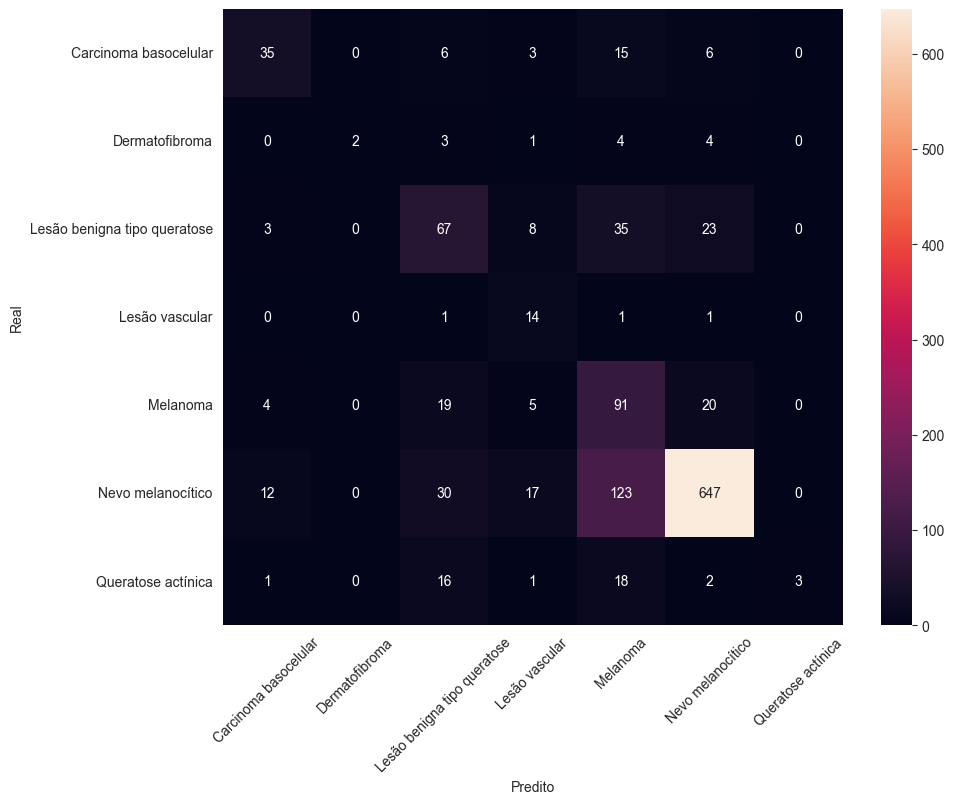

In [26]:
#----------------------------------------------------------------------------
# Matriz de confusão
#----------------------------------------------------------------------------
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10,8))
ax = sns.heatmap(cm, annot=True, fmt='d', xticklabels=list(train_gen.class_indices.keys()), yticklabels=list(train_gen.class_indices.keys()))
ax.set_xlabel('Predito')
ax.set_ylabel('Real')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


##### Agora iremos gerar imagens por meio do GRAND CAM para analisar os padrões de imagem treinados por nosso modelo CNN.

In [27]:
# ------------------------------------------------------------------
# Extraindo Mapa de Grad-CAM
# ------------------------------------------------------------------
def encontrar_ultima_conv(model):
    ultima_conv = None

    def procurar_camadas(m):
        nonlocal ultima_conv
        for layer in m.layers:
            if hasattr(layer, 'layers') and len(layer.layers) > 0:
                procurar_camadas(layer)
            if isinstance(layer, (tf.keras.layers.Conv2D,
                                  tf.keras.layers.DepthwiseConv2D,
                                  tf.keras.layers.SeparableConv2D)):
                ultima_conv = layer.name

    procurar_camadas(model)
    return ultima_conv

ultima_conv = encontrar_ultima_conv(model)
print("Última camada convolucional encontrada:", ultima_conv)

def gerar_gradcam_heatmap(model, img_array, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(model.input, [model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))

    conv_outputs = conv_outputs[0].numpy()
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:,:,i] *= pooled_grads[i]
    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= (heatmap.max() + 1e-8)
    heatmap = cv2.resize(heatmap, (IMG_SIZE[1], IMG_SIZE[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap

def gerar_mapa_gradcam(model, imagem_array, nome_camada_conv):
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(nome_camada_conv).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_output, pred = grad_model(imagem_array)
        classe_pred = tf.argmax(pred[0])
        loss = pred[:, classe_pred]

    grads = tape.gradient(loss, conv_output)[0]
    pesos = tf.reduce_mean(grads, axis=(0,1))
    gradcam = tf.reduce_sum(tf.multiply(pesos, conv_output[0]), axis=-1)

    heatmap = np.maximum(gradcam, 0) / (tf.reduce_max(gradcam) + 1e-8)
    heatmap = cv2.resize(heatmap.numpy(), (224,224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    return heatmap

Última camada convolucional encontrada: Conv_1


In [37]:
# ------------------------------------------------------------------
# Exibindo Grad-CAM em lote
# ------------------------------------------------------------------
def gradcam_em_lote(model, df, ultima_conv, IMG_SIZE=(224,224), num_imagens=6):
    
    exemplos = df.sample(num_imagens, random_state=42).reset_index(drop=True)
    plt.figure(figsize=(8, num_imagens * 3))

    for i, row in exemplos.iterrows():
        img_path = row['image_path']
        imagem = load_img(img_path, target_size=IMG_SIZE)
        imagem_arr = img_to_array(imagem) / 255.0
        entrada = tf.convert_to_tensor(np.expand_dims(imagem_arr, axis=0), dtype=tf.float32)

        mapa = gerar_mapa_gradcam(model, entrada, ultima_conv)
        mapa = cv2.resize(mapa, (IMG_SIZE[1], IMG_SIZE[0]))
        mapa = np.uint8(255 * mapa)
        mapa = cv2.applyColorMap(mapa, cv2.COLORMAP_JET)
        sobreposta = cv2.addWeighted(np.uint8(imagem_arr*255), 0.6, mapa, 0.4, 0)

        plt.subplot(num_imagens, 2, 2*i + 1)
        plt.imshow(imagem)
        plt.title(f'Imagem Original: {row["diagnostico"]}')
        plt.axis('off')

        plt.subplot(num_imagens, 2, 2*i + 2)
        plt.imshow(cv2.cvtColor(sobreposta, cv2.COLOR_BGR2RGB))
        plt.title('Mapa Grad-CAM')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

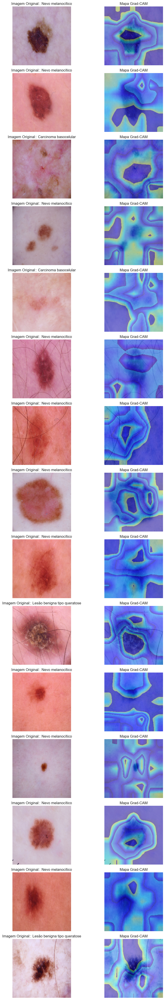

In [36]:
gradcam_em_lote(model, test_df, ultima_conv, num_imagens=15)

### 💻 5. Utilizando o Modelo

##### Agora iremos utilizar o nosso modelo treinado para validar imagens de um dataset apenas de imagens e fazer o mesmo a identificar o tipo de lesão e se possui câncer ou não.

Total imagens encontradas: 3297


,image_path,parent_folder
0,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,benign
1,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,benign
2,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,benign
3,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,benign
4,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,benign


Gerando um total de 30 imagens para predição.
Mapeamento de índices ->:
{0: 'Carcinoma basocelular', 1: 'Dermatofibroma', 2: 'Lesão benigna tipo queratose', 3: 'Lesão vascular', 4: 'Melanoma', 5: 'Nevo melanocítico', 6: 'Queratose actínica'}


,image_path,pred_idx,pred_class,pred_confidence,pred_cancer
0,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,6,Queratose actínica,0.252435,1
1,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,4,Melanoma,0.509252,1
2,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,4,Melanoma,0.396692,1
3,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,2,Lesão benigna tipo queratose,0.312143,0
4,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,3,Lesão vascular,0.341875,0
5,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,4,Melanoma,0.693424,1
6,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,4,Melanoma,0.411260,1
7,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,4,Melanoma,0.441437,1
8,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,4,Melanoma,0.323676,1
9,C:\Users\flmli\.cache\kagglehub\datasets\rm100...,4,Melanoma,0.497462,1


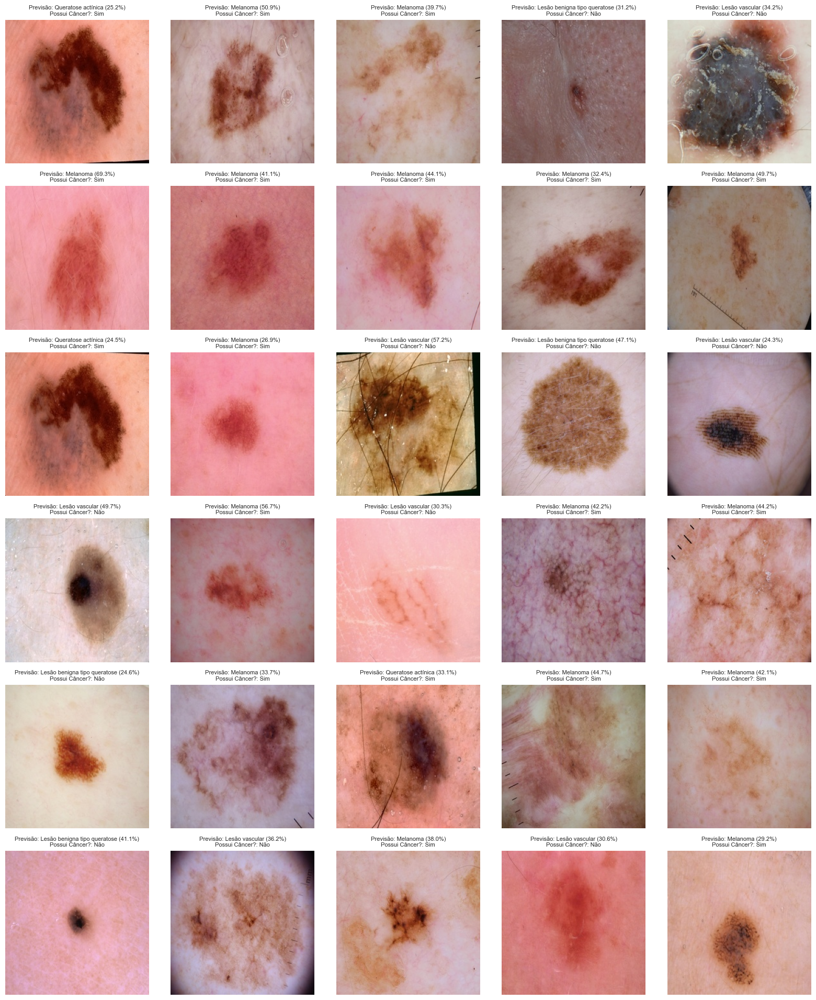

Resultados salvos em resultado_modelo.csv


In [40]:
#----------------------------------------------------------------------------
# Utilização do modelo para Predição
#----------------------------------------------------------------------------

rows = []
for root, dirs, files in os.walk(dataset_file2):
    for f in files:
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            full = os.path.join(root, f)
            parent = Path(root).name.lower()
            rows.append({'image_path': full, 'parent_folder': parent})

df_isic = pd.DataFrame(rows)
print(f"Total imagens encontradas: {len(df_isic)}")
display(df_isic.head())

if df_isic.empty:
    raise RuntimeError("Nenhuma imagem encontrada, por favor verifique o caminho.")

NUM_SAMPLES = min(30, len(df_isic))
sample_df = df_isic.sample(NUM_SAMPLES, random_state=42).reset_index(drop=True)
print(f"Gerando um total de {NUM_SAMPLES} imagens para predição.")

class_indices = getattr(train_gen, "class_indices", None)
if class_indices is None:
    raise RuntimeError("Train_Gen não encontrado.")

inv_class_indices = {v: k for k, v in class_indices.items()}
print("Mapeamento de índices ->:")
print(inv_class_indices)

def preprocess_image_for_model(img_path, target_size):
    img = load_img(img_path, target_size=target_size)
    img_arr = img_to_array(img)
    if img_arr.shape[-1] == 4:
        img_arr = img_arr[..., :3]
    if img_arr.ndim == 2:
        img_arr = np.stack([img_arr]*3, axis=-1)
    img_arr = img_arr / 255.0
    return img_arr

X = []
paths = []
for p in sample_df['image_path']:
    try:
        arr = preprocess_image_for_model(p, IMG_SIZE)
    except Exception as e:
        print("Erro ao carregar:", p, e)
        continue
    X.append(arr)
    paths.append(p)

if len(X) == 0:
    raise RuntimeError("Nenhuma imagem válida para a predição.")

X = np.array(X, dtype=np.float32)

#----------------------------------------------------------------------------
# Predição
#----------------------------------------------------------------------------
pred_probs = model.predict(X, verbose=0) 
pred_idx = np.argmax(pred_probs, axis=1)
pred_class_names = [inv_class_indices[i] for i in pred_idx]
pred_confidences = pred_probs[np.arange(len(pred_idx)), pred_idx]

#----------------------------------------------------------------------------
# Identificar se é câncer a partir de pred_class
#----------------------------------------------------------------------------
def is_cancer_by_pred_class(nome):
    if nome in ["Melanoma", "Carcinoma basocelular", "Queratose actínica"]:
        return 1
    return 0

pred_cancer = [is_cancer_by_pred_class(n) for n in pred_class_names]

results_df = pd.DataFrame({
    'image_path': paths,
    'pred_idx': pred_idx,
    'pred_class': pred_class_names,
    'pred_confidence': pred_confidences,
    'pred_cancer': pred_cancer
})

display(results_df.head(10))

#----------------------------------------------------------------------------
# Exibição de amostras (sem GT)
#----------------------------------------------------------------------------
n = len(results_df)
cols = 5
rows = max(1, (n + cols - 1) // cols)
plt.figure(figsize=(cols*3.2, rows*3.2))

for i, row in results_df.reset_index().iterrows():
    ax = plt.subplot(rows, cols, i+1)
    img = load_img(row['image_path'], target_size=IMG_SIZE)
    ax.imshow(img)

    pred_text = f"Previsão: {row['pred_class']} ({row['pred_confidence']*100:.1f}%)"
    cancer_text = 'Possui Câncer?: Sim' if row['pred_cancer']==1 else 'Possui Câncer?: Não'

    ax.set_title(f"{pred_text}\n{cancer_text}", fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

#----------------------------------------------------------------------------
# Salvar resultados
#----------------------------------------------------------------------------
results_df.to_csv('resultado_modelo.csv', index=False)
print("Resultados salvos em resultado_modelo.csv")